In [12]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd
import os
from glob import glob
from tqdm import tqdm
from random import randint
from IPython.display import clear_output
import ast

In [13]:
train_anns = dict()
train_anns['images'] = []
train_anns['annotations'] = []
train_anns['categories'] = [{'id': 0, 'name': 'wheat'}]
iid = 0
im2id = {}
aid = 0


In [14]:
## Init constant
DATA_DIR = './data/Wheatdetection'
IMG_DIR = f"{DATA_DIR}/train"
TARGETS = ['arvalis_1', 'arvalis_2', 'arvalis_3', 'inrae_1', 'usask_1', 'rres_1', 'ethz_1']
N_PATCH = [(2, 3), (2, 2), (2, 2), (2, 2), (1, 2), (2, 3), (1, 2)]
BOX_COLOR = [0,0,255]

### Image utils function

In [15]:
def plot_img(img, size=(7,7), is_rgb=False, title=""):
    if isinstance(img, str):
        img = load_img(img)
    plt.figure(figsize=size)
    if is_rgb:
        plt.imshow(img)
    else:
        plt.imshow(img[:,:,::-1])
    plt.suptitle(title)
    plt.show()
    
def plot_imgs(imgs, cols=5, size=7, is_rgb=False, title=""):
    rows = len(imgs)//cols + 1
    fig = plt.figure(figsize=(cols*size, rows*size))
    for i, img in enumerate(imgs):
        if isinstance(img, str):
            img = load_img(img, size=300)
        fig.add_subplot(rows, cols, i+1)
        if is_rgb:
            plt.imshow(img)
        else:
            plt.imshow(img[:,:,::-1])
    plt.suptitle(title)
    plt.show()
    
def visualize_bbox(img, boxes, thickness=3, color=BOX_COLOR):
    img_copy = img.copy()
    for box in boxes:
        #if(box[0] > 900 or box[1] > 900 or box[2] > 900 or box[3] > 900):
        if(box[0]%1024==0 or box[1]%1024==0 or box[2]%1024==0 or box[3]%1024==0):
          #if(box[0]% 1024 < 50 or box[0]%1024 > 970 or box[2]% 1024 < 50 or box[2]%1024 > 970 or box[1]% 1024 < 50 or box[1]%1024 > 970 or box[3]% 1024 < 50 or box[3]%1024 > 970):
            img_copy = cv2.rectangle(
                img_copy,
                (int(box[0]), int(box[1])),
                (int(box[2]), int(box[3])),
                color, thickness)
    return img_copy

def load_img(img_id):
    cv2.imread(f"{IMG_DIR}/{img_id}.jpg")

In [16]:

df = pd.read_csv(f"{DATA_DIR}/train.csv")
df[['x1', 'y1', 'w', 'h']] = pd.DataFrame(np.stack(df['bbox'].apply(lambda x: ast.literal_eval(x)))).astype(np.float32)
df['x2'] = df['x1'] + df['w']
df['y2'] = df['y1'] + df['h']
df.head()

,image_id,width,height,bbox,source,x1,y1,w,h,x2,y2
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1,834.0,222.0,56.0,36.0,890.0,258.0
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1,226.0,548.0,130.0,58.0,356.0,606.0
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1,377.0,504.0,74.0,160.0,451.0,664.0
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1,834.0,95.0,109.0,107.0,943.0,202.0
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1,26.0,144.0,124.0,117.0,150.0,261.0


In [17]:
marking = pd.read_csv(f"{DATA_DIR}/train.csv")
bboxs = np.stack(marking['bbox'].apply(lambda x: np.fromstring(x[1:-1], sep=',')))
for i, column in enumerate(['x', 'y', 'w', 'h']):
    marking[column] = bboxs[:,i]
marking.drop(columns=['bbox'], inplace=True)

import os
from datetime import datetime
import time
import random
import cv2
import pandas as pd
import numpy as np
import albumentations as A
import matplotlib.pyplot as plt
from albumentations.pytorch.transforms import ToTensorV2
from sklearn.model_selection import StratifiedKFold
from torch.utils.data import Dataset,DataLoader
from torch.utils.data.sampler import SequentialSampler, RandomSampler
from glob import glob

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

df_folds = marking[['image_id']].copy()
df_folds.loc[:, 'bbox_count'] = 1
df_folds = df_folds.groupby('image_id').count()
df_folds.loc[:, 'source'] = marking[['image_id', 'source']].groupby('image_id').min()['source']
df_folds.loc[:, 'stratify_group'] = np.char.add(
    df_folds['source'].values.astype(str),
    df_folds['bbox_count'].apply(lambda x: f'_{x // 15}').values.astype(str)
)
df_folds.loc[:, 'fold'] = 0

print(set(df_folds.source.values))

for fold_number, (train_index, val_index) in enumerate(skf.split(X=df_folds.index, y=df_folds['stratify_group'])):
    df_folds.loc[df_folds.iloc[val_index].index, 'fold'] = fold_number
    
val_id = df_folds[df_folds['fold'] == fold_number].index.values


def combine_result_masked(patch_grid, df):
    h, w = patch_grid.shape
    total_img = np.zeros((h*1024, w*1024, 3))
    all_boxes = []
    patch_img_ids = []
    
    for r in range(h):
        for c in range(w):
            img_id = patch_grid[r, c]["img_id"]
            patch_img = cv2.imread(f"{IMG_DIR}/{img_id}.jpg")
            
            xrange = [c*1024, (c+1)*1024]
            yrange = [r*1024, (r+1)*1024]
            
            #print(img_id)
            if img_id not in val_id:
                total_img[
                    yrange[0] : yrange[1],
                    xrange[0] : xrange[1], :
                ] = patch_img
            
            boxes = df[df["image_id"] == img_id][["x1", 'y1', 'x2', 'y2']]
            boxes["x1"] += xrange[0]
            boxes["x2"] += xrange[0]
            boxes["y1"] += yrange[0]
            boxes["y2"] += yrange[0]
            all_boxes.append(boxes)
            patch_img_ids.append(img_id)
    all_boxes = pd.concat(all_boxes)
    total_img = total_img.astype(np.uint8)
    return total_img, all_boxes, patch_img_ids

{'arvalis_2', 'rres_1', 'ethz_1', 'arvalis_1', 'arvalis_3', 'usask_1', 'inrae_1'}


/home/peiyuanl/anaconda3/envs/gnn/lib/python3.7/site-packages/sklearn/model_selection/_split.py:657: Warning: The least populated class in y has only 1 members, which is too few. The minimum number of members in any class cannot be less than n_splits=5.
  % (min_groups, self.n_splits)), Warning)


## Get left, right, top, bottom edges each image 

# Note: Run this for each tar_id for several times to generate COCO

In [18]:
TAR_ID = 2
img_ids = df[df["source"] == TARGETS[TAR_ID]]["image_id"].unique()
IMG_N = len(img_ids)
print(IMG_N)

l_edges = []
r_edges = []
t_edges = []
b_edges = []

for i, img_id in enumerate(img_ids):
    img = cv2.imread(f"{IMG_DIR}/{img_id}.jpg")
    ## normalize values by dividing max values
    l_edges.append(img[:,:1,:] / img[:,:1,:].max())
    r_edges.append(img[:,-1:,:] / img[:,-1:,:].max())
    t_edges.append(img[:1,:,:] / img[:1,:,:].max())
    b_edges.append(img[-1:,:,:] / img[-1:,:,:].max())
    
l_edges = np.squeeze(np.array(l_edges))
r_edges = np.squeeze(np.array(r_edges))
t_edges = np.squeeze(np.array(t_edges))
b_edges = np.squeeze(np.array(b_edges))

559


## Compute left-right distance, top-bottom distance matrix

LR_distance[i,j]: distance between I image's left edge and J image's right edge

TB_distance[i,j]: distance between I image's top edge and J image's bottom edge

In [19]:
def distance(edge1, edge2):
    d1 = np.abs(edge1 - edge2).mean()
    d2 = np.abs(edge1[1:,:] - edge2[:-1,:]).mean()
    d3 = np.abs(edge2[1:,:] - edge1[:-1,:]).mean()
    total_distance = d1+d2+d3
    return total_distance


LR_distance = np.zeros((IMG_N, IMG_N)) + 1e3
TB_distance = np.zeros((IMG_N, IMG_N)) + 1e3

for i, left in enumerate(l_edges):
    for j, right in enumerate(r_edges):
        if i == j:
            continue
        LR_distance[i,j] = distance(left, right)
print(LR_distance.shape)


for i, top in enumerate(t_edges):
    for j, bottom in enumerate(b_edges):
        if i == j:
            continue
        TB_distance[i,j] = distance(top, bottom)
print(TB_distance.shape)

(559, 559)
(559, 559)


# Search best matches 

In [20]:
def get_best_bottom_img(top_id, TB_distance):
    index = np.argmin(TB_distance[:, top_id])
    distance = TB_distance[index, top_id]
    return index, distance

def get_best_right_img(left_id, LR_distance):
    index = np.argmin(LR_distance[:, left_id])
    distance = LR_distance[index, left_id]
    return index, distance

def get_best_right_bottom_img(top_id, left_id, TB_distance, LR_distance):
    index = np.argmin(TB_distance[:, top_id] + LR_distance[:, left_id])
    distance = (TB_distance[index, top_id] + LR_distance[index, left_id])/2
    return index, distance

def index_grid_to_info_grid(patch_grid, img_ids):
    h_grid, w_grid = patch_grid.shape
    PATCH_INFO_GRID = np.zeros(patch_grid.shape).astype(np.object)
    for row in range(h_grid):
        for col in range(w_grid):
            index = patch_grid[row, col]
            PATCH_INFO_GRID[row, col] = {
                "index": index,
                "img_id": img_ids[index]
            }
    return PATCH_INFO_GRID


## Convert index-grid to info-grid
def combine_result(patch_grid, df):
    h, w = patch_grid.shape
    total_img = np.zeros((h*1024, w*1024, 3))
    all_boxes = []
    patch_img_ids = []
    
    for r in range(h):
        for c in range(w):
            img_id = patch_grid[r, c]["img_id"]
            patch_img = cv2.imread(f"{IMG_DIR}/{img_id}.jpg")
            
            xrange = [c*1024, (c+1)*1024]
            yrange = [r*1024, (r+1)*1024]
            total_img[
                yrange[0] : yrange[1],
                xrange[0] : xrange[1], :
            ] = patch_img
            
            boxes = df[df["image_id"] == img_id][["x1", 'y1', 'x2', 'y2']]
            boxes["x1"] += xrange[0]
            boxes["x2"] += xrange[0]
            boxes["y1"] += yrange[0]
            boxes["y2"] += yrange[0]
            all_boxes.append(boxes)
            patch_img_ids.append(img_id)
    all_boxes = pd.concat(all_boxes)
    total_img = total_img.astype(np.uint8)
    return total_img, all_boxes, patch_img_ids

## Main stratery

In [21]:
print(TAR_ID)
THRESHOLDS = [0.25, 0.33, 0.25, 0.25, 0.2, 0.1, 0.25]
threshold = THRESHOLDS[TAR_ID]
ALL_PATCH_GRIDS = []

for i, img_id in enumerate(img_ids):
    PATCH_GRID = np.zeros(N_PATCH[TAR_ID]).astype(np.object)
    h_grid, w_grid = PATCH_GRID.shape 
    PATCH_GRID[0,0] = i
    all_distance = []
    
    for row in range(h_grid):
        for col in range(w_grid):
            if col == 0 and row == 0:
                continue
            if col == 0:
                top_id = int(PATCH_GRID[row-1, col])
                PATCH_GRID[row, col], distance = get_best_bottom_img(top_id, TB_distance)
            if row == 0:
                left_id = int(PATCH_GRID[row, col-1])
                PATCH_GRID[row, col], distance = get_best_right_img(left_id, LR_distance)
            if row*col > 0:
                top_id = PATCH_GRID[row-1,col]
                left_id = PATCH_GRID[row, col-1]
                PATCH_GRID[row, col], distance = get_best_right_bottom_img(
                    top_id, left_id,
                    TB_distance, LR_distance
                )
            all_distance.append(distance)

    avg_distance = np.mean(all_distance)
    if avg_distance < threshold:
        ALL_PATCH_GRIDS.append(PATCH_GRID)
        
print(len(ALL_PATCH_GRIDS))

2
113


## Save new data

Remove the comment code if you want to save data

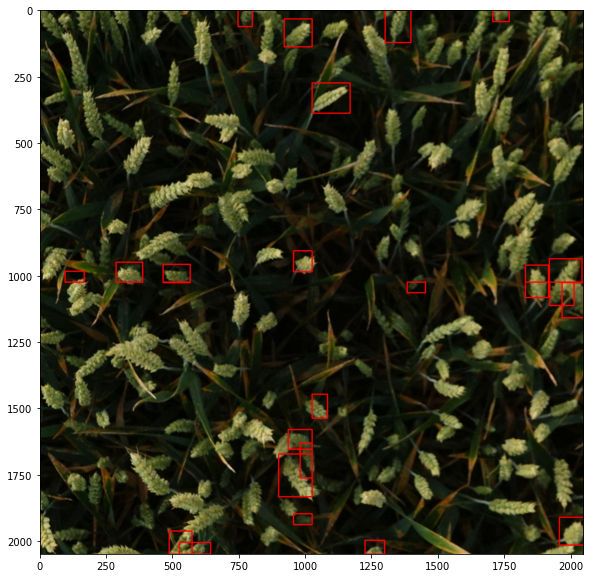

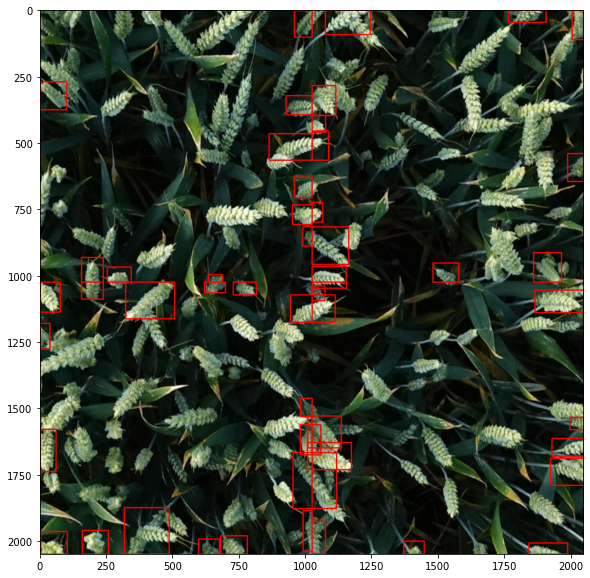

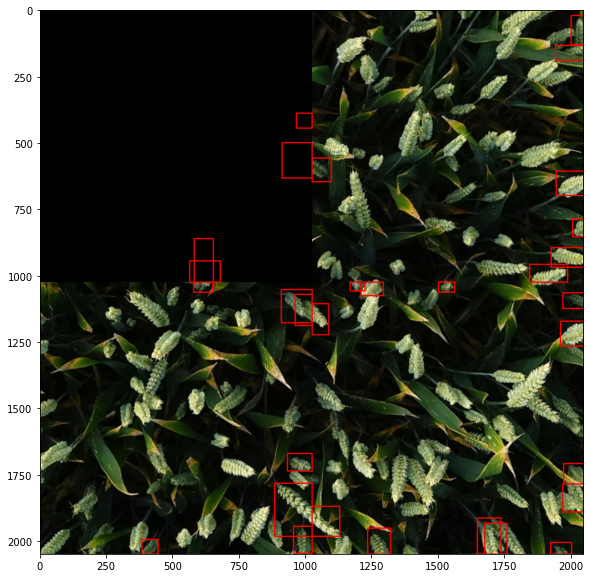

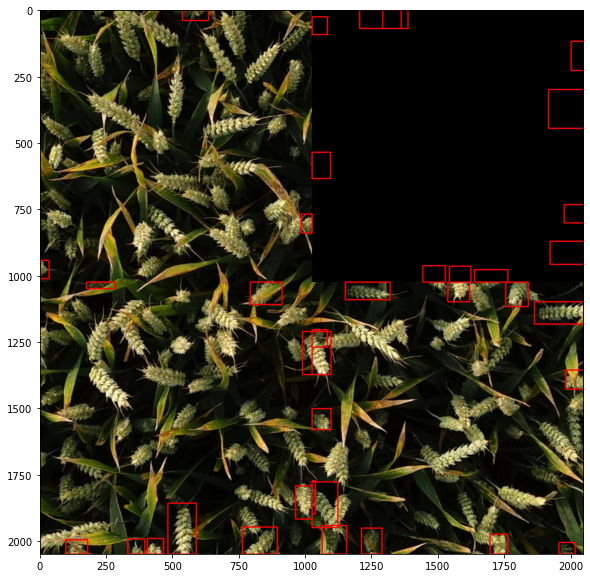

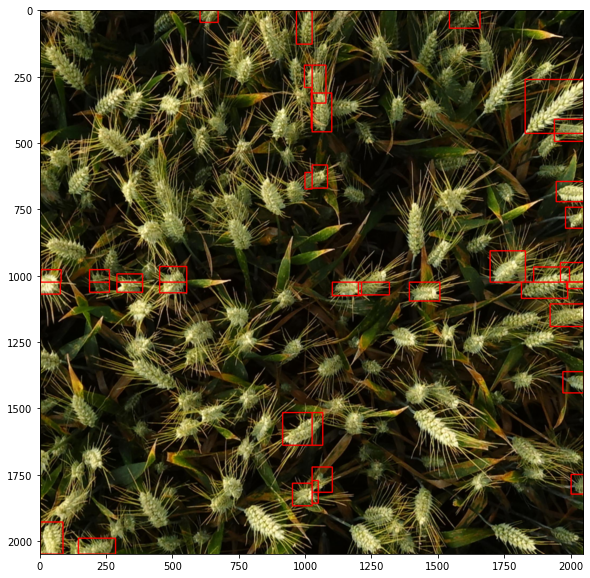

SAVE NEW DATA IN: origin_arvalis_3.csv


In [22]:
all_new_data = []
source = TARGETS[TAR_ID]
new_img_dir = "origin_img_masked" 
os.makedirs(new_img_dir, exist_ok=True)

for i, patch_grid in enumerate(ALL_PATCH_GRIDS):
    patch_grid = index_grid_to_info_grid(patch_grid, img_ids)
    total_img, boxes, patch_img_ids = combine_result_masked(patch_grid, df)
    bimg = total_img.copy()
    #print(boxes)
    for box in boxes.iterrows():
        box = box[1]
        bimg = cv2.rectangle(bimg,(box.x1, box.y1),(box.x2, box.y2),(102,255,0), 3)
    new_img_ids = source + '_' + "_".join(patch_img_ids)
    boxes["image_id"] = new_img_ids
    all_new_data.append(boxes)
    cv2.imwrite(f"{new_img_dir}/{new_img_ids}.jpg", total_img)
    cv2.imwrite(f"annotated/{new_img_ids}_annotated.jpg", bimg)
    
    if i < 5:
        total_img = visualize_bbox(total_img, boxes.values)
        plot_img(total_img, size=(10,10))
        #print(new_img_ids)

all_new_data = pd.concat(all_new_data)
csv_path = f"origin_{source}.csv"
print(f"SAVE NEW DATA IN: {csv_path}")

all_new_data.to_csv(csv_path)

In [12]:
all_new_data

,x1,y1,x2,y2,image_id
106713,919.0,33.0,1024.0,138.0,arvalis_3_aadb83e1d_eef9bcaf5_dc7f9cee6_8ba166588
106714,568.0,17.0,663.0,204.0,arvalis_3_aadb83e1d_eef9bcaf5_dc7f9cee6_8ba166588
106715,739.0,501.0,893.0,586.0,arvalis_3_aadb83e1d_eef9bcaf5_dc7f9cee6_8ba166588
106716,286.0,949.0,386.0,1024.0,arvalis_3_aadb83e1d_eef9bcaf5_dc7f9cee6_8ba166588
106717,657.0,660.0,798.0,832.0,arvalis_3_aadb83e1d_eef9bcaf5_dc7f9cee6_8ba166588
...,...,...,...,...,...
118018,1914.0,1599.0,1998.0,1671.0,arvalis_3_0e2be222f_b3e72b002_9561a71a0_23e761109
118019,1697.0,1126.0,1781.0,1226.0,arvalis_3_0e2be222f_b3e72b002_9561a71a0_23e761109
118020,1441.0,1671.0,1530.0,1763.0,arvalis_3_0e2be222f_b3e72b002_9561a71a0_23e761109
118021,1689.0,1802.0,1809.0,1907.0,arvalis_3_0e2be222f_b3e72b002_9561a71a0_23e761109


In [13]:
for im in tqdm(list(set(all_new_data.image_id.values))):
    image = cv2.imread(f"{new_img_dir}/{new_img_ids}.jpg")
    height, width, _ = image.shape
    image = {
        'file_name': f"{im}.jpg",
        'height': height,
        'width': width,
        'id': iid
            }
    train_anns['images'].append(image)
    im2id[im] = iid
    iid+=1
    #print(image.shape)
    #break

area = lambda x: (int(x[3])-int(x[1]))*(int(x[2])-int(x[0]))
for _, row in tqdm(all_new_data.iterrows()):
    #print(eval(row.bbox))
    bbox = [row.x1, row.y1, row.x2, row.y2]
    x = bbox
    ann = {
        'segmentation': [[x[0],x[1], #(x1, y1)
                          x[2],x[1], #(x2, y1)
                          x[2],x[3], #(x2, y2)
                          x[0],x[3]]], #(x1, y1)
        'area': area(bbox),
        'iscrowd': 0,
        'image_id': im2id[row.image_id],
        'bbox': bbox,
        'category_id': 0,
        'id': aid
    }
    aid += 1
    train_anns['annotations'].append(ann)
    #break

100%|██████████| 113/113 [00:04<00:00, 26.92it/s]
14301it [00:01, 7936.24it/s]


In [14]:
#train_anns

In [15]:
import json
"""
ANN = '/home/peiyuanl/kaggle/wheat_det/'
# Serializing json  
json_object = json.dumps(train_anns, indent = 4) 

with open(ANN+"full_annotations.json", "w") as outfile: 
    outfile.write(json_object) 
"""

'\nANN = \'/home/peiyuanl/kaggle/wheat_det/\'\n# Serializing json  \njson_object = json.dumps(train_anns, indent = 4) \n\nwith open(ANN+"full_annotations.json", "w") as outfile: \n    outfile.write(json_object) \n'

In [16]:
df = all_new_data

In [17]:
ut = 1
lt = 1023
a = df.loc[df['x1']==1024]
b = df.loc[df['x2']==1024]
#c = df.loc[df['y1']%1024<ut]
#d = df.loc[df['y2']%1024<ut]
#e = df.loc[df['x1']%1024>lt]
#f = df.loc[df['x2']%1024>lt]
#g = df.loc[df['y1']%1024>lt]
#h = df.loc[df['y2']%1024>lt]
#(box[0]%1024==0 or box[1]%1024==0 or box[2]%1024==0 or box[3]%1024==0):

In [18]:
cands = pd.concat([a,b]).drop_duplicates()
rest = df[~df.apply(tuple,1).isin(cands.apply(tuple,1))]

In [19]:
len(set(cands.image_id.values))

109

In [20]:
def overlap(ax1, ax2, bx1, bx2):
    #print(bx1, bx2)
    #print(ax1, ax2, bx1, bx2)
    if (ax1 > bx2) or (bx1 > ax2): return -1
    intersection = bx2 - ax1 if ax2 > bx2 else ax2 - bx1
    union = max(ax2, bx2) - min(ax1, bx1)
    #print(intersection, union)
    return float(intersection)/float(union)

In [21]:
from functools import reduce

csvs = []
for im in list(set(cands.image_id.values)):
    print('===============')
    print(im)
    imdf = (cands.loc[cands['image_id']==im])
    
    mat = imdf[['x1','y1','x2','y2']].values
    
    x1 = imdf[['x1']].values.reshape(-1)
    x2 = imdf[['x2']].values.reshape(-1)
    y1 = imdf[['y1']].values.reshape(-1)
    y2 = imdf[['y2']].values.reshape(-1)

    matched_pairs = []
    matched_boxes = []
    visited = set()
    
    threshold = 200
    matches = np.where(x2==1024)[0]
    
    r_cands = np.where(x1==1024)[0]
    
    print(matches, r_cands)
    
    for idx in r_cands:
        if idx in visited: continue
        if x1[idx] != 1024: continue
        
        #print(matches)
        if (len(matches) > 0):
            ay1 = y1[idx]
            ay2 = y2[idx]
            
            max_id = -1
            max_cov = -1
            for ma in matches:
                if ma in visited: continue
                cov = overlap(ay1,ay2,y1[ma],y2[ma]) 
                print(ay1,ay2,y1[ma],y2[ma])
                print("[idx {}, idx2 {}]: {}".format(idx, ma, cov))
                if cov == -1: continue
                if cov > max_cov:
                    max_id = ma
                    max_cov = cov
                    
            if (max_cov > 0.4):
                matched_pairs.append((idx,max_id))
                assert idx not in visited
                assert max_id not in visited
                visited.add(idx)
                visited.add(max_id)
                dx1 = min(x1[idx],x1[max_id])
                dy1 = min(y1[idx],y1[max_id])
                dx2 = max(x2[idx],x2[max_id])
                dy2 = max(y2[idx],y2[max_id])
                data = {
                    'image_id':im,
                    'x1': dx1,
                    'y1': dy1,
                    'x2': dx2,
                    'y2': dy2,
                }
                matched_boxes.append(pd.DataFrame(columns=['x1','y1','x2','y2','image_id'],data=data,index=[0]))
                
    print(matched_pairs) 
    #matched_indices = list(reduce(lambda x,y: x+y, matched_pairs)) if len(matched_pairs) > 0 else []
    #print(matched_indices)
    unmatched_indices = [i for i in range(len(x1)) if i not in visited]
    unmatched_boxes = imdf.iloc[unmatched_indices]
    
    matched_boxes = pd.concat(matched_boxes) if len(matched_boxes) > 0 else None
    csv=pd.concat([matched_boxes, unmatched_boxes]) if matched_boxes is not None else unmatched_boxes
    #print(csv)
    csvs.append(csv)
    #break

arvalis_3_9694225d3_bfbe6654b_e11b95f4e_d8cae4d1b
[ 9 10 11 12 13 14 15 16] [0 1 2 3 4 5 6 7 8]
463.0 570.0 332.0 401.0
[idx 0, idx2 9]: -1
463.0 570.0 660.0 765.0
[idx 0, idx2 10]: -1
463.0 570.0 122.0 240.0
[idx 0, idx2 11]: -1
463.0 570.0 39.0 108.0
[idx 0, idx2 12]: -1
463.0 570.0 801.0 872.0
[idx 0, idx2 13]: -1
463.0 570.0 1828.0 1948.0
[idx 0, idx2 14]: -1
463.0 570.0 1264.0 1474.0
[idx 0, idx2 15]: -1
463.0 570.0 1390.0 1600.0
[idx 0, idx2 16]: -1
332.0 401.0 332.0 401.0
[idx 1, idx2 9]: 1.0
332.0 401.0 660.0 765.0
[idx 1, idx2 10]: -1
332.0 401.0 122.0 240.0
[idx 1, idx2 11]: -1
332.0 401.0 39.0 108.0
[idx 1, idx2 12]: -1
332.0 401.0 801.0 872.0
[idx 1, idx2 13]: -1
332.0 401.0 1828.0 1948.0
[idx 1, idx2 14]: -1
332.0 401.0 1264.0 1474.0
[idx 1, idx2 15]: -1
332.0 401.0 1390.0 1600.0
[idx 1, idx2 16]: -1
2.0 99.0 660.0 765.0
[idx 2, idx2 10]: -1
2.0 99.0 122.0 240.0
[idx 2, idx2 11]: -1
2.0 99.0 39.0 108.0
[idx 2, idx2 12]: 0.5660377358490566
2.0 99.0 801.0 872.0
[idx 2, idx2 

[2] [0 1]
1024.0 1105.0 1223.0 1303.0
[idx 0, idx2 2]: -1
1313.0 1391.0 1223.0 1303.0
[idx 1, idx2 2]: -1
[]
arvalis_3_c64da3b0d_09b4141a6_2e0c19135_834690a35
[ 8  9 10 11 12 13 14 15 16 17] [0 1 2 3 4 5 6 7]
739.0 844.0 7.0 133.0
[idx 0, idx2 8]: -1
739.0 844.0 542.0 645.0
[idx 0, idx2 9]: -1
739.0 844.0 1784.0 1858.0
[idx 0, idx2 10]: -1
739.0 844.0 1937.0 2026.0
[idx 0, idx2 11]: -1
739.0 844.0 1249.0 1349.0
[idx 0, idx2 12]: -1
739.0 844.0 1479.0 1551.0
[idx 0, idx2 13]: -1
739.0 844.0 1543.0 1733.0
[idx 0, idx2 14]: -1
739.0 844.0 1133.0 1243.0
[idx 0, idx2 15]: -1
739.0 844.0 1587.0 1661.0
[idx 0, idx2 16]: -1
739.0 844.0 1241.0 1305.0
[idx 0, idx2 17]: -1
1784.0 1858.0 7.0 133.0
[idx 1, idx2 8]: -1
1784.0 1858.0 542.0 645.0
[idx 1, idx2 9]: -1
1784.0 1858.0 1784.0 1858.0
[idx 1, idx2 10]: 1.0
1784.0 1858.0 1937.0 2026.0
[idx 1, idx2 11]: -1
1784.0 1858.0 1249.0 1349.0
[idx 1, idx2 12]: -1
1784.0 1858.0 1479.0 1551.0
[idx 1, idx2 13]: -1
1784.0 1858.0 1543.0 1733.0
[idx 1, idx2 1

[3 4 5] [0 1 2]
586.0 688.0 335.0 414.0
[idx 0, idx2 3]: -1
586.0 688.0 903.0 964.0
[idx 0, idx2 4]: -1
586.0 688.0 3.0 100.0
[idx 0, idx2 5]: -1
1682.0 1741.0 335.0 414.0
[idx 1, idx2 3]: -1
1682.0 1741.0 903.0 964.0
[idx 1, idx2 4]: -1
1682.0 1741.0 3.0 100.0
[idx 1, idx2 5]: -1
1796.0 1892.0 335.0 414.0
[idx 2, idx2 3]: -1
1796.0 1892.0 903.0 964.0
[idx 2, idx2 4]: -1
1796.0 1892.0 3.0 100.0
[idx 2, idx2 5]: -1
[]
arvalis_3_931820800_d145202eb_3fe6394cd_ac5bb0dfa
[] [0]
[]
arvalis_3_0478cbc2a_83aae58fa_218a99bee_6f119c82d
[10 11 12 13 14 15 16 17 18] [0 1 2 3 4 5 6 7 8 9]
161.0 245.0 908.0 1003.0
[idx 0, idx2 10]: -1
161.0 245.0 668.0 742.0
[idx 0, idx2 11]: -1
161.0 245.0 606.0 680.0
[idx 0, idx2 12]: -1
161.0 245.0 465.0 550.0
[idx 0, idx2 13]: -1
161.0 245.0 317.0 389.0
[idx 0, idx2 14]: -1
161.0 245.0 1868.0 1963.0
[idx 0, idx2 15]: -1
161.0 245.0 1158.0 1232.0
[idx 0, idx2 16]: -1
161.0 245.0 1640.0 1786.0
[idx 0, idx2 17]: -1
161.0 245.0 1856.0 1960.0
[idx 0, idx2 18]: -1
668.

arvalis_3_aadb83e1d_eef9bcaf5_dc7f9cee6_8ba166588
[2 3 4 5 6 7] [0 1]
274.0 388.0 33.0 138.0
[idx 0, idx2 2]: -1
274.0 388.0 906.0 985.0
[idx 0, idx2 3]: -1
274.0 388.0 1671.0 1832.0
[idx 0, idx2 4]: -1
274.0 388.0 1630.0 1761.0
[idx 0, idx2 5]: -1
274.0 388.0 1579.0 1653.0
[idx 0, idx2 6]: -1
274.0 388.0 1896.0 1937.0
[idx 0, idx2 7]: -1
1446.0 1536.0 33.0 138.0
[idx 1, idx2 2]: -1
1446.0 1536.0 906.0 985.0
[idx 1, idx2 3]: -1
1446.0 1536.0 1671.0 1832.0
[idx 1, idx2 4]: -1
1446.0 1536.0 1630.0 1761.0
[idx 1, idx2 5]: -1
1446.0 1536.0 1579.0 1653.0
[idx 1, idx2 6]: -1
1446.0 1536.0 1896.0 1937.0
[idx 1, idx2 7]: -1
[]
arvalis_3_952ce366b_49c3e4f6e_4fbf0c8b7_d69f6d767
[ 6  7  8  9 10] [0 1 2 3 4 5]
30.0 136.0 632.0 709.0
[idx 0, idx2 6]: -1
30.0 136.0 791.0 872.0
[idx 0, idx2 7]: -1
30.0 136.0 132.0 339.0
[idx 0, idx2 8]: 0.012944983818770227
30.0 136.0 1297.0 1431.0
[idx 0, idx2 9]: -1
30.0 136.0 1111.0 1218.0
[idx 0, idx2 10]: -1
632.0 709.0 632.0 709.0
[idx 1, idx2 6]: 1.0
632.0 709

arvalis_3_f99daf7f6_3ba5d332c_43cf9ed10_3db94deb2
[3 4] [0 1 2]
153.0 227.0 57.0 151.0
[idx 0, idx2 3]: -1
153.0 227.0 1227.0 1279.0
[idx 0, idx2 4]: -1
855.0 919.0 57.0 151.0
[idx 1, idx2 3]: -1
855.0 919.0 1227.0 1279.0
[idx 1, idx2 4]: -1
1228.0 1280.0 57.0 151.0
[idx 2, idx2 3]: -1
1228.0 1280.0 1227.0 1279.0
[idx 2, idx2 4]: 0.9622641509433962
[(2, 4)]
arvalis_3_02fe8c28e_f02cb9a6a_f05830c46_cadb3740d
[4 5 6 7] [0 1 2 3]
263.0 335.0 673.0 770.0
[idx 0, idx2 4]: -1
263.0 335.0 10.0 92.0
[idx 0, idx2 5]: -1
263.0 335.0 1868.0 1927.0
[idx 0, idx2 6]: -1
263.0 335.0 1761.0 1823.0
[idx 0, idx2 7]: -1
1551.0 1617.0 673.0 770.0
[idx 1, idx2 4]: -1
1551.0 1617.0 10.0 92.0
[idx 1, idx2 5]: -1
1551.0 1617.0 1868.0 1927.0
[idx 1, idx2 6]: -1
1551.0 1617.0 1761.0 1823.0
[idx 1, idx2 7]: -1
1753.0 1815.0 673.0 770.0
[idx 2, idx2 4]: -1
1753.0 1815.0 10.0 92.0
[idx 2, idx2 5]: -1
1753.0 1815.0 1868.0 1927.0
[idx 2, idx2 6]: -1
1753.0 1815.0 1761.0 1823.0
[idx 2, idx2 7]: 0.7714285714285715
1267

[(0, 10), (1, 11), (3, 13), (4, 14), (9, 15)]
arvalis_3_97316e61d_ac1e7253a_f6b9d6dd1_4767561f3
[0] []
[]
arvalis_3_15c794bfc_41c9d0538_5a76259a0_96efbda67
[7 8 9] [0 1 2 3 4 5 6]
145.0 258.0 145.0 258.0
[idx 0, idx2 7]: 1.0
145.0 258.0 624.0 714.0
[idx 0, idx2 8]: -1
145.0 258.0 483.0 622.0
[idx 0, idx2 9]: -1
624.0 714.0 624.0 714.0
[idx 1, idx2 8]: 1.0
624.0 714.0 483.0 622.0
[idx 1, idx2 9]: -1
396.0 551.0 483.0 622.0
[idx 2, idx2 9]: 0.3008849557522124
721.0 801.0 483.0 622.0
[idx 3, idx2 9]: -1
898.0 1024.0 483.0 622.0
[idx 4, idx2 9]: -1
1025.0 1089.0 483.0 622.0
[idx 5, idx2 9]: -1
1707.0 1830.0 483.0 622.0
[idx 6, idx2 9]: -1
[(0, 7), (1, 8)]
arvalis_3_7b7b3c08f_93be53f09_2c9b5552e_4ff1646a8
[1 2] [0]
1024.0 1111.0 314.0 481.0
[idx 0, idx2 1]: -1
1024.0 1111.0 1223.0 1303.0
[idx 0, idx2 2]: -1
[]
arvalis_3_cf0401699_26d7e7074_b65a59339_2d06b68f0
[11 12 13 14 15 16 17 18] [ 0  1  2  3  4  5  6  7  8  9 10]
230.0 291.0 488.0 573.0
[idx 0, idx2 11]: -1
230.0 291.0 872.0 970.0
[id

15.0 102.0 599.0 698.0
[idx 1, idx2 13]: -1
15.0 102.0 1108.0 1182.0
[idx 1, idx2 14]: -1
15.0 102.0 1410.0 1474.0
[idx 1, idx2 15]: -1
15.0 102.0 1580.0 1698.0
[idx 1, idx2 16]: -1
15.0 102.0 1198.0 1262.0
[idx 1, idx2 17]: -1
15.0 102.0 1761.0 1839.0
[idx 1, idx2 18]: -1
15.0 102.0 1858.0 1927.0
[idx 1, idx2 19]: -1
970.0 1024.0 599.0 698.0
[idx 2, idx2 13]: -1
970.0 1024.0 1108.0 1182.0
[idx 2, idx2 14]: -1
970.0 1024.0 1410.0 1474.0
[idx 2, idx2 15]: -1
970.0 1024.0 1580.0 1698.0
[idx 2, idx2 16]: -1
970.0 1024.0 1198.0 1262.0
[idx 2, idx2 17]: -1
970.0 1024.0 1761.0 1839.0
[idx 2, idx2 18]: -1
970.0 1024.0 1858.0 1927.0
[idx 2, idx2 19]: -1
583.0 652.0 599.0 698.0
[idx 3, idx2 13]: 0.4608695652173913
583.0 652.0 1108.0 1182.0
[idx 3, idx2 14]: -1
583.0 652.0 1410.0 1474.0
[idx 3, idx2 15]: -1
583.0 652.0 1580.0 1698.0
[idx 3, idx2 16]: -1
583.0 652.0 1198.0 1262.0
[idx 3, idx2 17]: -1
583.0 652.0 1761.0 1839.0
[idx 3, idx2 18]: -1
583.0 652.0 1858.0 1927.0
[idx 3, idx2 19]: -1
504

In [22]:
corrected_2 = pd.concat(csvs)
corrected_2 = pd.concat([rest,corrected_2])

In [23]:
a = corrected_2.loc[corrected_2['y1']==1024]
b = corrected_2.loc[corrected_2['y2']==1024]
cands = pd.concat([a,b]).drop_duplicates()
rest = corrected_2[~corrected_2.apply(tuple,1).isin(cands.apply(tuple,1))]

In [24]:
from functools import reduce

csvs = []
for im in list(set(cands.image_id.values)):
    print('===============')
    print(im)
    imdf = (cands.loc[cands['image_id']==im])
    
    mat = imdf[['x1','y1','x2','y2']].values
    
    x1 = imdf[['x1']].values.reshape(-1)
    x2 = imdf[['x2']].values.reshape(-1)
    y1 = imdf[['y1']].values.reshape(-1)
    y2 = imdf[['y2']].values.reshape(-1)

    matched_pairs = []
    matched_boxes = []
    visited = set()
    
    threshold = 200
    matches = np.where(y2==1024)[0]
    
    r_cands = np.where(y1==1024)[0]
    
    print(matches, r_cands)
    
    for idx in r_cands:
        if idx in visited: continue
        if y1[idx] != 1024: continue
        
        #print(matches)
        if (len(matches) > 0):
            ax1 = x1[idx]
            ax2 = x2[idx]
            
            max_id = -1
            max_cov = -1
            for ma in matches:
                if ma in visited: continue
                cov = overlap(ax1,ax2,x1[ma],x2[ma]) 
                print(ax1,ax2,x1[ma],x2[ma])
                print("[idx {}, idx2 {}]: {}".format(idx, ma, cov))
                if cov == -1: continue
                if cov > max_cov:
                    max_id = ma
                    max_cov = cov
                    
            if (max_cov > 0.4):
                matched_pairs.append((idx,max_id))
                assert idx not in visited
                assert max_id not in visited
                visited.add(idx)
                visited.add(max_id)
                dx1 = min(x1[idx],x1[max_id])
                dy1 = min(y1[idx],y1[max_id])
                dx2 = max(x2[idx],x2[max_id])
                dy2 = max(y2[idx],y2[max_id])
                data = {
                    'image_id':im,
                    'x1': dx1,
                    'y1': dy1,
                    'x2': dx2,
                    'y2': dy2,
                }
                matched_boxes.append(pd.DataFrame(columns=['x1','y1','x2','y2','image_id'],data=data,index=[0]))
                
    print(matched_pairs) 
    #matched_indices = list(reduce(lambda x,y: x+y, matched_pairs)) if len(matched_pairs) > 0 else []
    #print(matched_indices)
    unmatched_indices = [i for i in range(len(x1)) if i not in visited]
    unmatched_boxes = imdf.iloc[unmatched_indices]
    
    matched_boxes = pd.concat(matched_boxes) if len(matched_boxes) > 0 else None
    csv=pd.concat([matched_boxes, unmatched_boxes]) if matched_boxes is not None else unmatched_boxes
    #print(csv)
    csvs.append(csv)
    #break

arvalis_3_9694225d3_bfbe6654b_e11b95f4e_d8cae4d1b
[ 8  9 10 11 12 13 14] [0 1 2 3 4 5 6 7]
330.0 430.0 130.0 240.0
[idx 0, idx2 8]: -1
330.0 430.0 619.0 785.0
[idx 0, idx2 9]: -1
330.0 430.0 752.0 919.0
[idx 0, idx2 10]: -1
330.0 430.0 852.0 947.0
[idx 0, idx2 11]: -1
330.0 430.0 1386.0 1477.0
[idx 0, idx2 12]: -1
330.0 430.0 1585.0 1662.0
[idx 0, idx2 13]: -1
330.0 430.0 1818.0 1957.0
[idx 0, idx2 14]: -1
741.0 830.0 130.0 240.0
[idx 1, idx2 8]: -1
741.0 830.0 619.0 785.0
[idx 1, idx2 9]: 0.20853080568720378
741.0 830.0 752.0 919.0
[idx 1, idx2 10]: 0.43820224719101125
741.0 830.0 852.0 947.0
[idx 1, idx2 11]: -1
741.0 830.0 1386.0 1477.0
[idx 1, idx2 12]: -1
741.0 830.0 1585.0 1662.0
[idx 1, idx2 13]: -1
741.0 830.0 1818.0 1957.0
[idx 1, idx2 14]: -1
852.0 947.0 130.0 240.0
[idx 2, idx2 8]: -1
852.0 947.0 619.0 785.0
[idx 2, idx2 9]: -1
852.0 947.0 852.0 947.0
[idx 2, idx2 11]: 1.0
852.0 947.0 1386.0 1477.0
[idx 2, idx2 12]: -1
852.0 947.0 1585.0 1662.0
[idx 2, idx2 13]: -1
852.0 947

arvalis_3_e2caa2ca7_708553a80_140ef3997_352c3a397
[3 4 5 6] [0 1 2]
373.0 458.0 140.0 212.0
[idx 0, idx2 3]: -1
373.0 458.0 373.0 458.0
[idx 0, idx2 4]: 1.0
373.0 458.0 855.0 921.0
[idx 0, idx2 5]: -1
373.0 458.0 1836.0 1943.0
[idx 0, idx2 6]: -1
1812.0 1940.0 140.0 212.0
[idx 1, idx2 3]: -1
1812.0 1940.0 855.0 921.0
[idx 1, idx2 5]: -1
1812.0 1940.0 1836.0 1943.0
[idx 1, idx2 6]: 0.7938931297709924
1062.0 1177.0 140.0 212.0
[idx 2, idx2 3]: -1
1062.0 1177.0 855.0 921.0
[idx 2, idx2 5]: -1
[(0, 4), (1, 6)]
arvalis_3_7bb11e582_db3eb3f0c_fb0a8b6b3_38b19d4f5
[2 3 4] [0 1]
870.0 963.0 860.0 988.0
[idx 0, idx2 2]: 0.8046875
870.0 963.0 0.0 85.0
[idx 0, idx2 3]: -1
870.0 963.0 1164.0 1300.0
[idx 0, idx2 4]: -1
1962.0 2048.0 0.0 85.0
[idx 1, idx2 3]: -1
1962.0 2048.0 1164.0 1300.0
[idx 1, idx2 4]: -1
[(0, 2)]
arvalis_3_0e2be222f_b3e72b002_9561a71a0_23e761109
[2 3 4] [0 1]
1937.0 2048.0 1772.0 1841.0
[idx 0, idx2 2]: -1
1937.0 2048.0 1709.0 1788.0
[idx 0, idx2 3]: -1
1937.0 2048.0 1250.0 1347.

[idx 4, idx2 8]: -1
[(2, 5), (3, 6), (4, 7)]
arvalis_3_10e1fb0e8_1b3380c60_3a97dc987_07479da31
[3 4] [0 1 2]
1843.0 1958.0 646.0 713.0
[idx 0, idx2 3]: -1
1843.0 1958.0 1830.0 1945.0
[idx 0, idx2 4]: 0.796875
1771.0 1858.0 646.0 713.0
[idx 1, idx2 3]: -1
924.0 1110.0 646.0 713.0
[idx 2, idx2 3]: -1
[(0, 4)]
arvalis_3_aadb83e1d_eef9bcaf5_dc7f9cee6_8ba166588
[4 5 6 7 8] [0 1 2 3]
463.0 565.0 286.0 386.0
[idx 0, idx2 4]: -1
463.0 565.0 463.0 565.0
[idx 0, idx2 5]: 1.0
463.0 565.0 94.0 166.0
[idx 0, idx2 6]: -1
463.0 565.0 1917.0 2040.0
[idx 0, idx2 7]: -1
463.0 565.0 1827.0 1914.0
[idx 0, idx2 8]: -1
1919.0 2010.0 286.0 386.0
[idx 1, idx2 4]: -1
1919.0 2010.0 94.0 166.0
[idx 1, idx2 6]: -1
1919.0 2010.0 1917.0 2040.0
[idx 1, idx2 7]: 0.7560975609756098
1919.0 2010.0 1827.0 1914.0
[idx 1, idx2 8]: -1
1827.0 1914.0 286.0 386.0
[idx 2, idx2 4]: -1
1827.0 1914.0 94.0 166.0
[idx 2, idx2 6]: -1
1827.0 1914.0 1827.0 1914.0
[idx 2, idx2 8]: 1.0
1382.0 1451.0 286.0 386.0
[idx 3, idx2 4]: -1
1382.0

arvalis_3_30bbd3d87_4c8159dbd_832cf59eb_b47137eb7
[1 2] [0]
824.0 890.0 678.0 737.0
[idx 0, idx2 1]: -1
824.0 890.0 1868.0 2009.0
[idx 0, idx2 2]: -1
[]
arvalis_3_5834f6ee5_2ad7fa68e_80f1cb7ee_d067ac2b1
[6 7] [0 1 2 3 4 5]
483.0 588.0 483.0 588.0
[idx 0, idx2 6]: 1.0
483.0 588.0 363.0 453.0
[idx 0, idx2 7]: -1
655.0 788.0 363.0 453.0
[idx 1, idx2 7]: -1
778.0 942.0 363.0 453.0
[idx 2, idx2 7]: -1
737.0 864.0 363.0 453.0
[idx 3, idx2 7]: -1
1523.0 1679.0 363.0 453.0
[idx 4, idx2 7]: -1
1838.0 1909.0 363.0 453.0
[idx 5, idx2 7]: -1
[(0, 6)]
arvalis_3_a84af52ba_81e06a4cd_809f14a6a_ce3999eb9
[3 4 5] [0 1 2]
752.0 826.0 752.0 826.0
[idx 0, idx2 3]: 1.0
752.0 826.0 814.0 865.0
[idx 0, idx2 4]: 0.10619469026548672
752.0 826.0 1024.0 1026.0
[idx 0, idx2 5]: -1
1242.0 1325.0 814.0 865.0
[idx 1, idx2 4]: -1
1242.0 1325.0 1024.0 1026.0
[idx 1, idx2 5]: -1
1024.0 1026.0 814.0 865.0
[idx 2, idx2 4]: -1
1024.0 1026.0 1024.0 1026.0
[idx 2, idx2 5]: 1.0
[(0, 3), (2, 5)]
arvalis_3_7d0d1f2f4_3ef86180e_b

547.0 647.0 547.0 647.0
[idx 0, idx2 6]: 1.0
547.0 647.0 384.0 478.0
[idx 0, idx2 7]: -1
547.0 647.0 1272.0 1433.0
[idx 0, idx2 8]: -1
384.0 478.0 384.0 478.0
[idx 1, idx2 7]: 1.0
384.0 478.0 1272.0 1433.0
[idx 1, idx2 8]: -1
1500.0 1734.0 1272.0 1433.0
[idx 2, idx2 8]: -1
1436.0 1505.0 1272.0 1433.0
[idx 3, idx2 8]: -1
1835.0 2035.0 1272.0 1433.0
[idx 4, idx2 8]: -1
944.0 1202.0 1272.0 1433.0
[idx 5, idx2 8]: -1
[(0, 6), (1, 7)]
arvalis_3_77222a135_d3b4a0cdf_1914c04d6_234cc40aa
[10 11 12 13 14 15 16 17 18] [0 1 2 3 4 5 6 7 8 9]
609.0 691.0 499.0 573.0
[idx 0, idx2 10]: -1
609.0 691.0 322.0 396.0
[idx 0, idx2 11]: -1
609.0 691.0 40.0 186.0
[idx 0, idx2 12]: -1
609.0 691.0 773.0 908.0
[idx 0, idx2 13]: -1
609.0 691.0 737.0 839.0
[idx 0, idx2 14]: -1
609.0 691.0 448.0 499.0
[idx 0, idx2 15]: -1
609.0 691.0 1070.0 1216.0
[idx 0, idx2 16]: -1
609.0 691.0 1804.0 1922.0
[idx 0, idx2 17]: -1
609.0 691.0 1024.0 1095.0
[idx 0, idx2 18]: -1
505.0 573.0 499.0 573.0
[idx 1, idx2 10]: 1.0
505.0 573

In [25]:
corrected_3 = pd.concat(csvs)
corrected_3 = pd.concat([rest,corrected_3])

In [26]:
corrected = corrected_3#pd.concat(csvs)
csv_path = f"/home/peiyuanl/kaggle/wheat_det/data/Wheatdetection/fullsize/origin_{source}_corrected.csv"

corrected.to_csv(csv_path,index=False)

In [27]:
csvs[100]

,x1,y1,x2,y2,image_id
0,184.0,995.0,256.0,1149.0,arvalis_3_c9ade75be_4e7b1a596_ccfff0629_9988ee066
0,1333.0,926.0,1482.0,1059.0,arvalis_3_c9ade75be_4e7b1a596_ccfff0629_9988ee066
0,1692.0,814.0,1774.0,1026.0,arvalis_3_c9ade75be_4e7b1a596_ccfff0629_9988ee066
115722,732.0,1024.0,834.0,1088.0,arvalis_3_c9ade75be_4e7b1a596_ccfff0629_9988ee066
115731,627.0,1024.0,709.0,1059.0,arvalis_3_c9ade75be_4e7b1a596_ccfff0629_9988ee066
115746,371.0,1024.0,430.0,1052.0,arvalis_3_c9ade75be_4e7b1a596_ccfff0629_9988ee066
119718,1913.0,1024.0,1990.0,1233.0,arvalis_3_c9ade75be_4e7b1a596_ccfff0629_9988ee066
107277,5.0,952.0,143.0,1024.0,arvalis_3_c9ade75be_4e7b1a596_ccfff0629_9988ee066
111417,1464.0,903.0,1610.0,1024.0,arvalis_3_c9ade75be_4e7b1a596_ccfff0629_9988ee066
111437,1024.0,970.0,1070.0,1024.0,arvalis_3_c9ade75be_4e7b1a596_ccfff0629_9988ee066


In [28]:
matched_pairs

[(1, 3)]

In [29]:
from functools import reduce

reduce(lambda x,y: x+y, [(0,1),(2,3)])

(0, 1, 2, 3)

/home/peiyuanl/kaggle/wheat_det/origin_img/arvalis_3_331cefee1_383817085_444977945_b5e726c10.jpg
[ 542. 1024.  629. 1070.]
[ 806. 1024.  939. 1064.]
[ 714. 1024.  791. 1103.]
[ 542.  962.  629. 1024.]
--------
[ 542.  962.  629. 1070.]
[ 806. 1024.  939. 1064.]
[ 714. 1024.  791. 1103.]


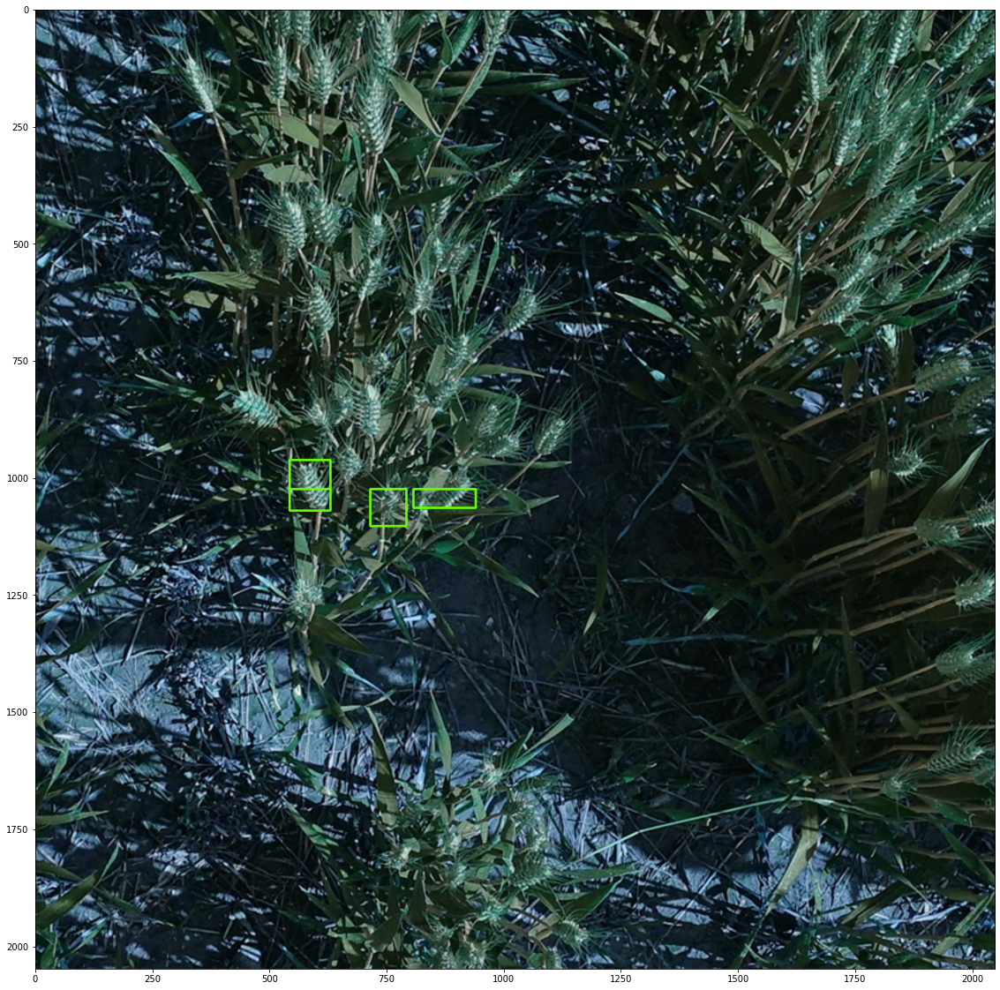

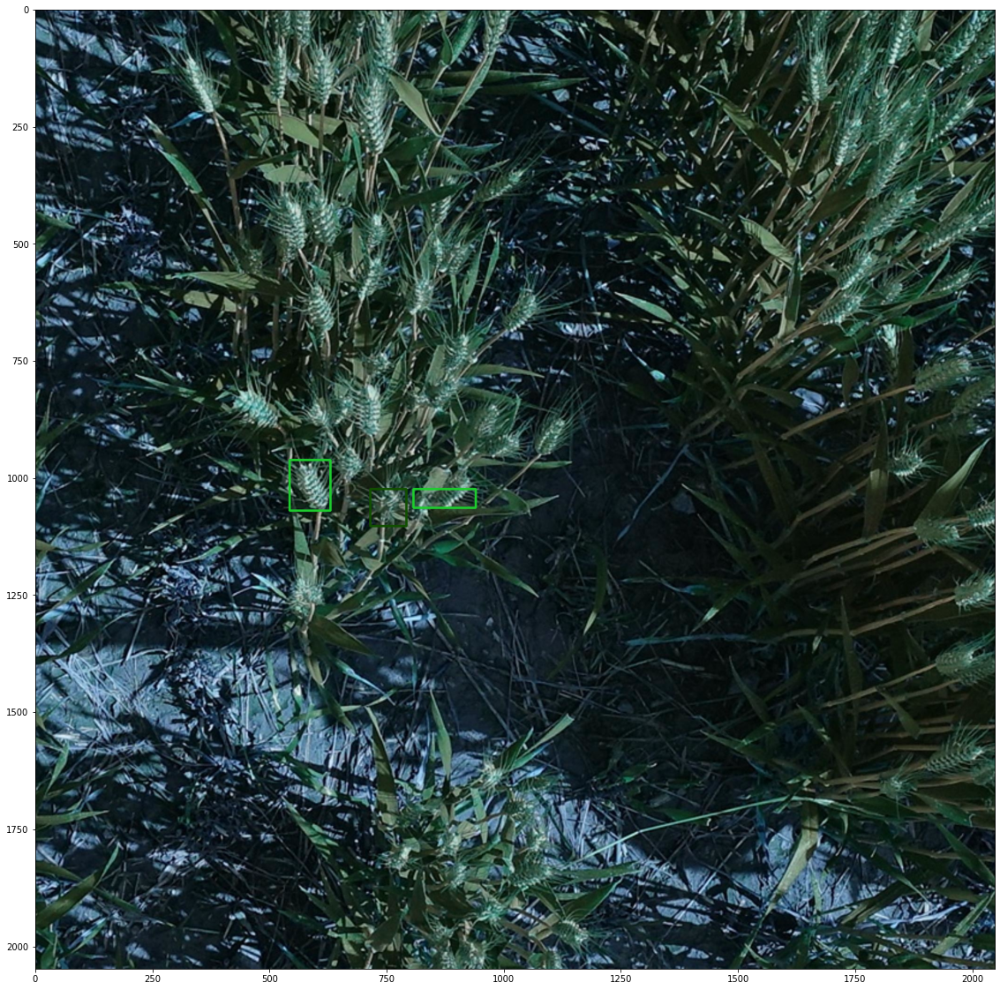

In [30]:
color = list(np.random.choice(range(256), size=100))

idx = 35

imid = csvs[idx].image_id.values[0]
size = 20
fig, ax = plt.subplots(1, 1, figsize=(size, size))
DIR_TEST = '/home/peiyuanl/kaggle/wheat_det/origin_img'
img_pth = os.path.join(DIR_TEST, imid+'.jpg')
print(img_pth)
image = cv2.imread(img_pth)

#boxes = [mat[41], mat[60]]
#boxes = mat[x1_cands]
boxes = cands.loc[cands['image_id']==imid][['x1','y1','x2','y2']].values
#boxes = [mat[0], mat[2]]
#np.random.shuffle(boxes)
#print(boxes.shape)
i = 0
for box in boxes:
    print(box)
    image = cv2.rectangle(image,(box[0], box[1]),(box[2], box[3]),(102,255,0), 3)
    i+=1

ax.imshow(image)

print('--------')

fig2, ax2 = plt.subplots(1, 1, figsize=(size, size))
image2 = cv2.imread(img_pth)

boxes = csvs[idx][['x1','y1','x2','y2']].values
#boxes = [mat[0], mat[2]]
#np.random.shuffle(boxes)
#print(boxes.shape)
i = 0
k = 0
for box in boxes:
    print(box)
    if i % 2 == 0:
        colors = (int(color[k]), int(color[k+1]), int(color[k+2]))
        k+=3
    image2 = cv2.rectangle(image2,(box[0], box[1]),(box[2], box[3]),colors, 3)
    i+=1

ax2.imshow(image2)

/home/peiyuanl/kaggle/wheat_det/origin_img/arvalis_3_7e0523b81_8f3e2b4e8_16501f9a1_777fa71f7.jpg
--------


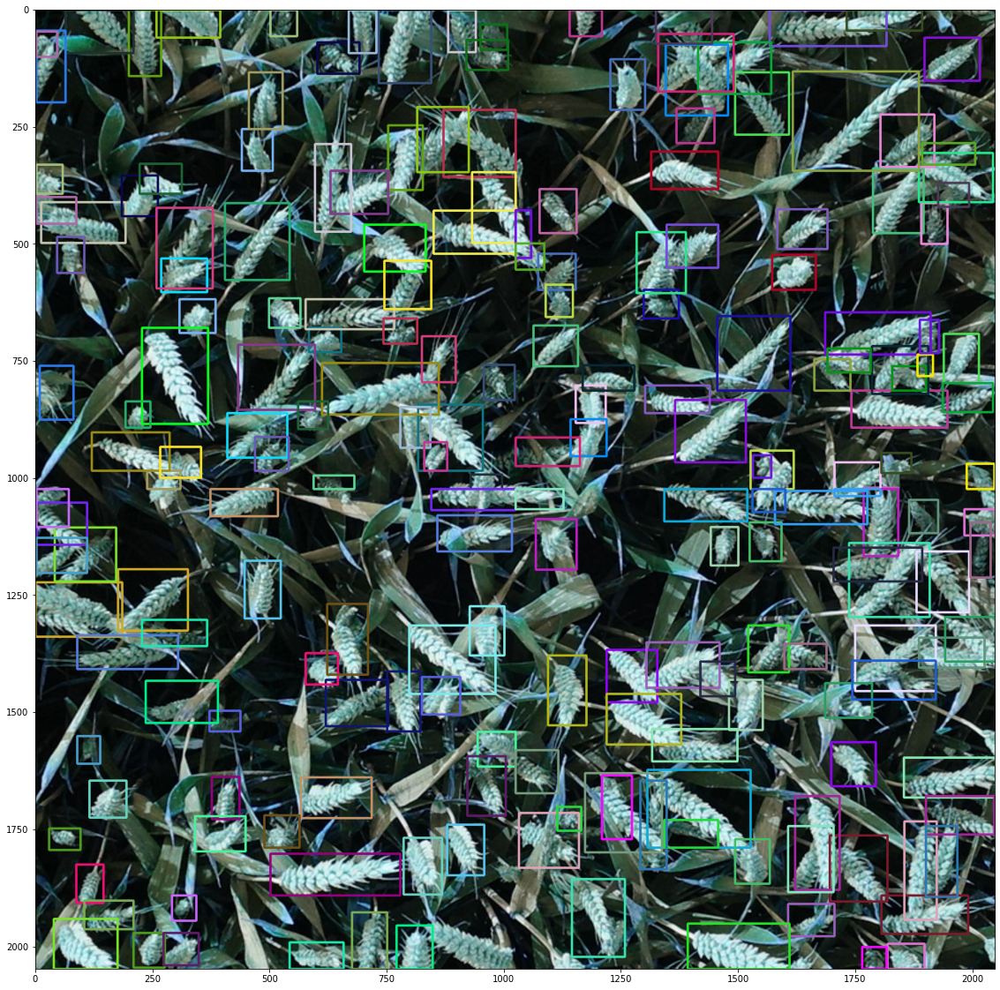

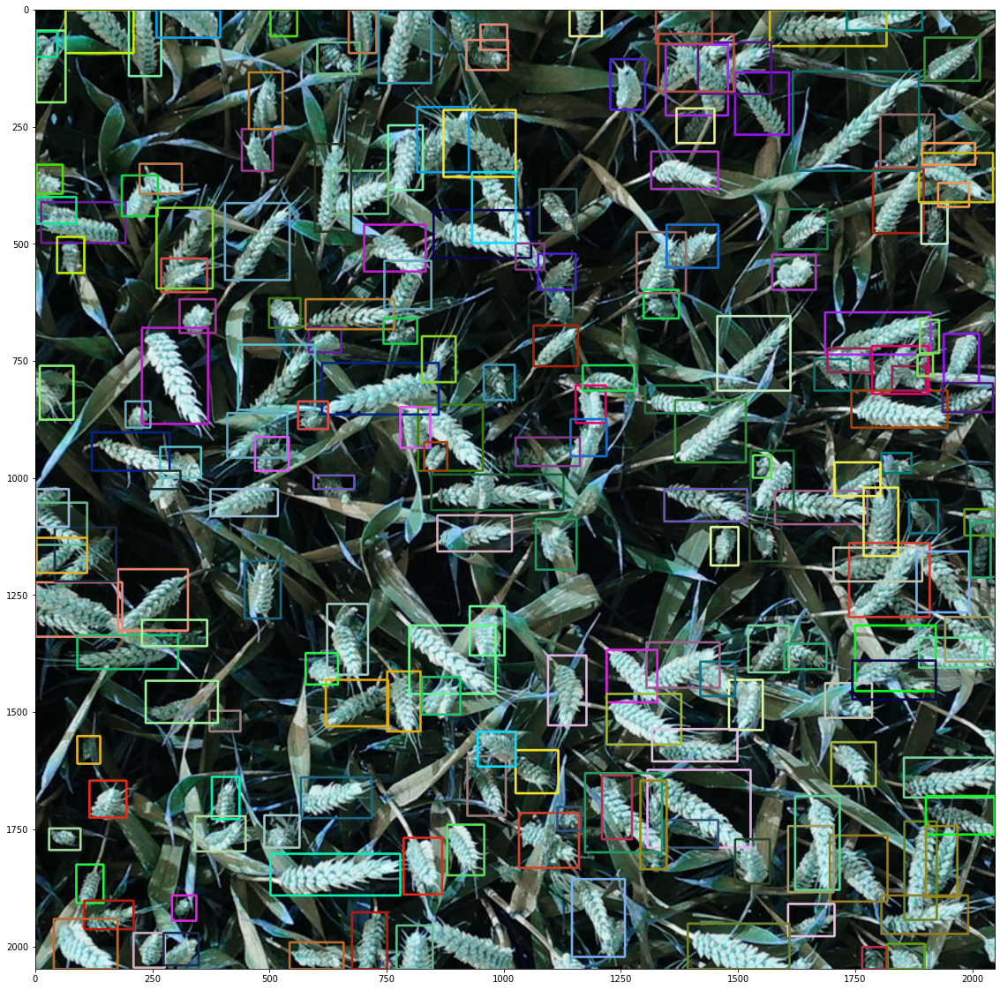

In [34]:
color = list(np.random.choice(range(256), size=300))

idx = 70

imid = csvs[idx].image_id.values[0]
size = 20
fig, ax = plt.subplots(1, 1, figsize=(size, size))
DIR_TEST = '/home/peiyuanl/kaggle/wheat_det/origin_img'
img_pth = os.path.join(DIR_TEST, imid+'.jpg')
print(img_pth)
image = cv2.imread(img_pth)

#boxes = [mat[41], mat[60]]
#boxes = mat[x1_cands]
boxes = df.loc[df['image_id']==imid][['x1','y1','x2','y2']].values
#boxes = [mat[0], mat[2]]
#np.random.shuffle(boxes)
#print(boxes.shape)
i = 0
for box in boxes:
    #print(box)
    if i % 2 == 0:
        k%=295
        colors = (int(color[k]), int(color[k+1]), int(color[k+2]))
        k+=3
    image = cv2.rectangle(image,(box[0], box[1]),(box[2], box[3]),colors, 3)
    i+=1

ax.imshow(image)

print('--------')

fig2, ax2 = plt.subplots(1, 1, figsize=(size, size))
image2 = cv2.imread(img_pth)

boxes = corrected.loc[corrected['image_id']==imid][['x1','y1','x2','y2']].values
#boxes = [mat[0], mat[2]]
#np.random.shuffle(boxes)
#print(boxes.shape)
i = 0
k = 0
for box in boxes:
    #print(box)
    if i % 2 == 0:
        k%=295
        colors = (int(color[k]), int(color[k+1]), int(color[k+2]))
        k+=3
    image2 = cv2.rectangle(image2,(box[0], box[1]),(box[2], box[3]),colors, 3)
    i+=1

ax2.imshow(image2)

In [ ]:
pd.concat([a,b,c,d]).drop_duplicates()

In [ ]:
b =pd.concat([df,df])

In [ ]:
b.drop_duplicates() == df

In [ ]:
set([1,2,3]) - set([1])

In [ ]:
import numpy as np
import os
from PIL import Image
from tqdm import tqdm
import json